Remove records that still have missing spatial coordinates after attempting address-to-coordinate conversion via Kakao API.

ex) service_facility = service_facility.dropna(subset=['latitude', 'longitude']).reset_index(drop=True)

## Generate Gyeonggi-do Grids

In [ ]:
import geopandas as gpd
import pandas as pd

files = [
    "grid_daa_1K",
    "grid_daba_1K",
    "grid_dasa_1K",
    "grid_laa_1K",
    "grid_laba_1K",
    "grid_lasa_1K",
]

base_path = "/content/"  

gdfs = []
for f in files:
    gdf = gpd.read_file(f"{base_path}{f}.shp")
    gdfs.append(gdf)

merged = pd.concat(gdfs, ignore_index=True)
print(merged.columns.tolist())  

['GRID_CD', 'geometry']


In [ ]:
merged.head()

,GRID_CD,geometry
0,다아3700,"POLYGON ((937000 2000000, 937000 2001000, 9380..."
1,다아3800,"POLYGON ((938000 2000000, 938000 2001000, 9390..."
2,다아3900,"POLYGON ((939000 2000000, 939000 2001000, 9400..."
3,다아4000,"POLYGON ((940000 2000000, 940000 2001000, 9410..."
4,다아4001,"POLYGON ((940000 2001000, 940000 2002000, 9410..."


In [ ]:
import requests
import geopandas as gpd
import pandas as pd
from shapely.geometry import shape

url = "https://raw.githubusercontent.com/southkorea/southkorea-maps/master/kostat/2018/json/skorea-provinces-2018-geo.json"
resp = requests.get(url)
provinces = gpd.read_file(resp.text)

print(provinces.columns.tolist())

['name', 'base_year', 'name_eng', 'code', 'geometry']


In [ ]:
print(provinces['name'].unique())

['서울특별시' '부산광역시' '대구광역시' '인천광역시' '광주광역시' '대전광역시' '울산광역시' '세종특별자치시' '경기도'
 '강원도' '충청북도' '충청남도' '전라북도' '전라남도' '경상북도' '경상남도' '제주특별자치도']


In [ ]:
gyeonggi = provinces[provinces['name'] == '경기도']

merged = merged.to_crs(gyeonggi.crs)

result = gpd.sjoin(merged, gyeonggi[['geometry']], how="inner", predicate="intersects")

print(result.shape)
print(result.columns.tolist())

(10847, 3)
['GRID_CD', 'geometry', 'index_right']


In [ ]:
result = result.drop(columns=['index_right'])
result = result.reset_index(drop=True)
result.head()

,GRID_CD,geometry
0,다아3700,"POLYGON ((126.78246 37.99781, 126.78238 38.006..."
1,다아3800,"POLYGON ((126.79385 37.99788, 126.79377 38.006..."
2,다아3900,"POLYGON ((126.80524 37.99795, 126.80516 38.006..."
3,다아4000,"POLYGON ((126.81663 37.99801, 126.81655 38.007..."
4,다아4001,"POLYGON ((126.81655 38.00703, 126.81646 38.016..."


In [ ]:
len(result)

10847

## Administrative & Welfare Center(행정복지센터) Data Preprocessing

In [ ]:
new_village = pd.read_csv("/content/new_village.csv", encoding="UTF-8")
new_village.head(5)

,연번,시도,시군구,읍면동,우편번호,주소,latitude,longitude
0,1199,경기,김포시,통진읍 행정복지센터,10019,경기도 김포시 통진읍 마송1로 77,37.686673,126.600049
1,1200,경기,김포시,고촌읍 행정복지센터,10129,경기도 김포시 고촌읍 장차로 14,37.603305,126.770949
2,1201,경기,김포시,양촌읍 행정복지센터,10057,경기도 김포시 양촌읍 양곡1로68번길 37,37.657201,126.625431
3,1202,경기,김포시,대곶면 행정복지센터,10040,경기 김포시 대곶면 율생로 83-23,37.649110,126.581959
4,1203,경기,김포시,월곶면 행정복지센터,10024,경기도 김포시 월곶면 군하로 263,37.715138,126.552843


In [4]:
import requests
import pandas as pd
import time

KAKAO_API_KEY = "d084bd2c363be7445e3f06a9bd9c67d4"

def get_coordinates_kakao(address):
    url = "https://dapi.kakao.com/v2/local/search/address.json"
    headers = {"Authorization": f"KakaoAK {KAKAO_API_KEY}"}
    params = {"query": address}
    try:
        resp = requests.get(url, headers=headers, params=params, timeout=5)
        result = resp.json()
        if result["documents"]:
            lat = float(result["documents"][0]["y"])
            lon = float(result["documents"][0]["x"])
            return lat, lon
        return None, None
    except Exception as e:
        print(f"Error: {address} → {e}")
        return None, None

In [ ]:
new_village[new_village['latitude'].isna() | new_village['longitude'].isna()]

,연번,시도,시군구,읍면동,우편번호,주소,latitude,longitude


In [ ]:
new_village.head()

,연번,시도,시군구,읍면동,우편번호,주소,latitude,longitude
0,1199,경기,김포시,통진읍 행정복지센터,10019,경기도 김포시 통진읍 마송1로 77,37.686673,126.600049
1,1200,경기,김포시,고촌읍 행정복지센터,10129,경기도 김포시 고촌읍 장차로 14,37.603305,126.770949
2,1201,경기,김포시,양촌읍 행정복지센터,10057,경기도 김포시 양촌읍 양곡1로68번길 37,37.657201,126.625431
3,1202,경기,김포시,대곶면 행정복지센터,10040,경기 김포시 대곶면 율생로 83-23,37.649110,126.581959
4,1203,경기,김포시,월곶면 행정복지센터,10024,경기도 김포시 월곶면 군하로 263,37.715138,126.552843


## Senior Center(경로당) Data Preprocessing

In [ ]:
senior_center = pd.read_csv("/content/senior_center.csv", encoding="UTF-8")
senior_center.head(5)

,시군명,시설명,도로명 주소,지번 주소,우편번호,전화번호,관할기관명,관할담당부서명,관할연락처,비고,WGS84위도,WGS84경도
0,가평군,가일1리 경로당,경기도 가평군 설악면 유명산길 19-1,경기도 가평군 설악면 가일리 193-2번지,12473.0,031-584-6831,가평군청,행복돌봄과,031-580-2285,NaN,37.599985,127.493067
1,가평군,가일2리 경로당,경기도 가평군 설악면 어비산길 168,경기도 가평군 설악면 가일리 91번지,12473.0,NaN,가평군청,행복돌봄과,031-580-2285,NaN,37.595360,127.509470
2,가평군,가평읍분회,경기도 가평군 가평읍 가화로 26-25,경기도 가평군 가평읍 대곡리 13-4번지,12421.0,031-582-7210,가평군청,행복돌봄과,031-580-2285,NaN,37.822298,127.517760
3,가평군,가평자이아파트경로당,경기도 가평군 가평읍 문화로 91,경기도 가평군 가평읍 대곡리 695번지 가평자이 104동 경로당 1층,12416.0,NaN,가평군청,행복돌봄과,031-580-2285,NaN,37.821289,127.507329
4,가평군,개곡1리 경로당,경기도 가평군 가평읍 능모루길 117,경기도 가평군 가평읍 개곡리 781-11번지,12410.0,031-582-2293,가평군청,행복돌봄과,031-580-2285,NaN,37.867342,127.532448


In [ ]:
senior_center = senior_center.rename(columns={'WGS84위도': 'latitude'})
senior_center = senior_center.rename(columns={'WGS84경도': 'longitude'})

In [ ]:
senior_center[senior_center['latitude'].isna() | senior_center['longitude'].isna()]

,시군명,시설명,도로명 주소,지번 주소,우편번호,전화번호,관할기관명,관할담당부서명,관할연락처,비고,latitude,longitude
15,가평군,대곡1리(남) 경로당,NaN,경기도 가평군 가평읍 오리나무길 44/실주소 오리나무길 54-2,NaN,031-582-2263,가평군청,행복돌봄과,031-580-2285,NaN,NaN,NaN
350,고양시,밤가시1단지경로당,NaN,경기도 고양시 일산동구 일산로 463번길,NaN,031-918-9678,일산동구 가정복지과,노인복지팀,031-8075-5710,NaN,NaN,NaN
446,고양시,성사3경로당(12통),NaN,경기도 고양시 덕양구 호국로790번길49-7,10463.0,031-963-6656,덕양구 가정복지과,노인복지팀,031-8075-5413,NaN,NaN,NaN
454,고양시,성원3단지경로당,NaN,경기도 고양시 일산동구 고풍로 72,10307.0,031-902-1332,일산동구 가정복지과,노인복지팀,031-8075-5734,NaN,NaN,NaN
479,고양시,식사1통경로당,NaN,경기도 고양시 일산동구 식사동 1통 영심길1,10324.0,031-969-3445,일산동구 가정복지과,노인복지팀,031-8075-5674,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
9130,포천시,만세교1리경로당,NaN,경기도 포천시 신북면 호국로 2446-16,11139.0,031-535-8598,포천시,노인장애인과,031-538-2319,NaN,NaN,NaN
9405,하남시,미사강변12단지@경로당,NaN,경기도 하남시 미사강변로 177,NaN,031-791-4548,하남시,노인장애인복지과,031-790-5719,NaN,NaN,NaN
9635,화성시,노진5리 경로당,NaN,경기도 화성시 장안면 노진길 138-1,18585.0,031-358-0309,화성시청 주민센터,중장년노인복지과,031-5189-3200,NaN,NaN,NaN
9795,화성시,"반송 (14,15,16,17,18통)",NaN,경기도 화성시 동탄반3길 51 (반송동),NaN,031-613-7265,화성시 동탄출장소,사회복지과,031-5189-5217,NaN,NaN,NaN


In [ ]:
senior_center['latitude'] = senior_center['latitude'].astype(float)
senior_center['longitude'] = senior_center['longitude'].astype(float)

In [ ]:
senior_center = senior_center.dropna(subset=['지번 주소']).reset_index(drop=True)

mask = senior_center['latitude'].isna() | senior_center['longitude'].isna()

senior_center.loc[mask, ['latitude', 'longitude']] = senior_center.loc[mask, '지번 주소'].apply(
    lambda x: pd.Series(get_coordinates_kakao(x))
).values

senior_center[senior_center['latitude'].isna() | senior_center['longitude'].isna()]

,시군명,시설명,도로명 주소,지번 주소,우편번호,전화번호,관할기관명,관할담당부서명,관할연락처,비고,latitude,longitude
15,가평군,대곡1리(남) 경로당,NaN,경기도 가평군 가평읍 오리나무길 44/실주소 오리나무길 54-2,NaN,031-582-2263,가평군청,행복돌봄과,031-580-2285,NaN,NaN,NaN
446,고양시,성사3경로당(12통),NaN,경기도 고양시 덕양구 호국로790번길49-7,10463.0,031-963-6656,덕양구 가정복지과,노인복지팀,031-8075-5413,NaN,NaN,NaN
454,고양시,성원3단지경로당,NaN,경기도 고양시 일산동구 고풍로 72,10307.0,031-902-1332,일산동구 가정복지과,노인복지팀,031-8075-5734,NaN,NaN,NaN
666,고양시,풍동숲속마을1단지경로당,NaN,경기도 고양시 일산동구 숲속1로 29-15,NaN,031-903-5830,일산동구 가정복지과,노인복지팀,031-8075-5741,NaN,NaN,NaN
928,광주시,경안6통,NaN,경기도 광주시 경안길58번길 17,NaN,031-765-5560,경안동사무소,찾아가는보건복지팀,031-760-4621,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
9130,포천시,만세교1리경로당,NaN,경기도 포천시 신북면 호국로 2446-16,11139.0,031-535-8598,포천시,노인장애인과,031-538-2319,NaN,NaN,NaN
9405,하남시,미사강변12단지@경로당,NaN,경기도 하남시 미사강변로 177,NaN,031-791-4548,하남시,노인장애인복지과,031-790-5719,NaN,NaN,NaN
9635,화성시,노진5리 경로당,NaN,경기도 화성시 장안면 노진길 138-1,18585.0,031-358-0309,화성시청 주민센터,중장년노인복지과,031-5189-3200,NaN,NaN,NaN
9795,화성시,"반송 (14,15,16,17,18통)",NaN,경기도 화성시 동탄반3길 51 (반송동),NaN,031-613-7265,화성시 동탄출장소,사회복지과,031-5189-5217,NaN,NaN,NaN


In [ ]:
senior_center = senior_center.dropna(subset=['latitude', 'longitude']).reset_index(drop=True)
senior_center.head(5)

,시군명,시설명,도로명 주소,지번 주소,우편번호,전화번호,관할기관명,관할담당부서명,관할연락처,비고,latitude,longitude
0,가평군,가일1리 경로당,경기도 가평군 설악면 유명산길 19-1,경기도 가평군 설악면 가일리 193-2번지,12473.0,031-584-6831,가평군청,행복돌봄과,031-580-2285,NaN,37.599985,127.493067
1,가평군,가일2리 경로당,경기도 가평군 설악면 어비산길 168,경기도 가평군 설악면 가일리 91번지,12473.0,NaN,가평군청,행복돌봄과,031-580-2285,NaN,37.595360,127.509470
2,가평군,가평읍분회,경기도 가평군 가평읍 가화로 26-25,경기도 가평군 가평읍 대곡리 13-4번지,12421.0,031-582-7210,가평군청,행복돌봄과,031-580-2285,NaN,37.822298,127.517760
3,가평군,가평자이아파트경로당,경기도 가평군 가평읍 문화로 91,경기도 가평군 가평읍 대곡리 695번지 가평자이 104동 경로당 1층,12416.0,NaN,가평군청,행복돌봄과,031-580-2285,NaN,37.821289,127.507329
4,가평군,개곡1리 경로당,경기도 가평군 가평읍 능모루길 117,경기도 가평군 가평읍 개곡리 781-11번지,12410.0,031-582-2293,가평군청,행복돌봄과,031-580-2285,NaN,37.867342,127.532448


## Medical Facility Data Preprocessing

In [ ]:
medical = pd.read_csv("/content/medical.csv",encoding="UTF-8")
medical.head(5)

,사업장명,인허가일자,소재지도로명주소,소재지지번주소,소재지우편번호,위도,경도,영업상태명,폐업일자,소재지시설전화번호,...,Y좌표값,의료기관종별명,의료인수,입원실수,병상수,총면적,진료과목내용,진료과목내용정보,특수구급차대수,일반구급차대수
0,(늘푸른의료재단) 보바스병원,20040414,NaN,경기도 성남시 분당구 정자동15,13555.0,NaN,NaN,폐업,20060526.0,NaN,...,NaN,병원,1,0,0,0.00,401,치과,NaN,NaN
1,(사)한국노년자원봉사회 동방요양병원,20110620,"경기도 안양시 만안구 병목안로 31-1 (안양동,지하1층, 지상1,2,3,4층)","경기도 안양시 만안구 안양4동 711번지 6호 지하1층, 지상1,2,3,4층",14002.0,37.397862,126.917766,폐업,20130118.0,031-469-9117,...,432867.0334,요양병원(일반요양병원),3,3,60,817.59,101 104 113 122 102 105 120 106 115 114,"내과, 신경과, 외과, 정형외과, 신경외과, 이비인후과, 피부과, 비뇨의학과, 재활...",NaN,NaN
2,(사)한국장애인케어협회 굿닥터병원,20090917,경기도 화성시 효행구 효행로265번길 16 (기안동),경기도 화성시 효행구 기안동 353번지,18337.0,37.225085,126.973699,폐업,20140902.0,031-8013-7582,...,413692.7600,병원,8,12,50,1370.93,101 111 113 115 114 109 105,"내과, 정형외과, 마취통증의학과, 소아청소년과, 이비인후과, 피부과, 비뇨의학과",NaN,NaN
3,(의)대선의료재단으뜸요양병원,20060310,"경기도 안산시 상록구 용신로 352 (본오동, 목화웨딩홀)",경기도 안산시 상록구 본오동 878번지 3호 지하1층 ~ 지상5층,15537.0,37.301537,126.861155,폐업,20241127.0,031-363-5200,...,422180.7000,요양병원(일반요양병원),16,23,107,3506.02,120 104 301,"외과, 재활의학과, 한방내과",NaN,NaN
4,(의)수지의료재단 용인수지병원,20161212,"경기도 용인시 수지구 풍덕천로22번길 15, 지하1,지상2~6층 (풍덕천동)",경기도 용인시 수지구 풍덕천동 514-1 수지요양병원,16846.0,37.316865,127.084846,영업중,NaN,031-262-0050,...,423870.0224,병원,14,58,148,4310.37,301 122 114 113 111 109 102 101,"내과, 신경과, 마취통증의학과, 소아청소년과, 이비인후과, 피부과, 가정의학과, 한방내과",NaN,NaN


In [ ]:
medical = medical[medical['영업상태명'] != '폐업'].reset_index(drop=True)
medical.head()

,사업장명,인허가일자,소재지도로명주소,소재지지번주소,소재지우편번호,위도,경도,영업상태명,폐업일자,소재지시설전화번호,...,Y좌표값,의료기관종별명,의료인수,입원실수,병상수,총면적,진료과목내용,진료과목내용정보,특수구급차대수,일반구급차대수
0,(의)수지의료재단 용인수지병원,20161212,"경기도 용인시 수지구 풍덕천로22번길 15, 지하1,지상2~6층 (풍덕천동)",경기도 용인시 수지구 풍덕천동 514-1 수지요양병원,16846.0,37.316865,127.084846,영업중,NaN,031-262-0050,...,423870.0224,병원,14,58,148,4310.37,301 122 114 113 111 109 102 101,"내과, 신경과, 마취통증의학과, 소아청소년과, 이비인후과, 피부과, 가정의학과, 한방내과",NaN,NaN
1,(의)영문의료재단 다보스병원,20081224,"경기도 용인시 처인구 백옥대로1082번길 18, 다보스종합병원 (김량장동)",경기도 용인시 처인구 김량장동 18번지 4호 다보스종합병원,17063.0,37.231546,127.211416,영업중,NaN,031-8021-2114,...,414433.3785,종합병원,281,61,251,22086.23,411 408 406 405 125 124 122 119 116 115 114 11...,"내과, 신경과, 외과, 정형외과, 신경외과, 마취통증의학과, 산부인과, 소아청소년과...",NaN,NaN
2,(의)유일재단 하나애병원,20080423,경기도 용인시 처인구 백옥대로916번길 48 (남동),경기도 용인시 처인구 남동 306번지,17147.0,37.219355,127.213503,영업중,NaN,031-339-1000,...,413085.1913,병원,38,37,157,4319.45,101 102 103 114 120 122 301,"내과, 신경과, 정신건강의학과, 피부과, 재활의학과, 가정의학과, 한방내과",NaN,NaN
3,(의)현당의료재단 늘봄요양병원,20180425,"경기도 용인시 수지구 포은대로59번길 17, 광교복합의료센터,지하1층,1층일부,2층...","경기도 용인시 수지구 상현동 1186번지 광교복합의료센터,지하1층,1층일부,2층~4...",16864.0,37.301077,127.065875,영업중,NaN,031-659-7800,...,422120.5613,요양병원(일반요양병원),57,104,300,8224.24,101 117 120 301,"내과, 방사선종양학과, 재활의학과, 한방내과",NaN,NaN
4,(의)효심의료재단 용인서울병원,20020612,경기도 용인시 처인구 고림로 81 (고림동),경기도 용인시 처인구 고림동 787번지 1호,17148.0,37.240315,127.214483,영업중,NaN,031-337-0114,...,415384.0329,병원,71,62,200,12333.16,125 116 109 106 105 104 102 101,"내과, 신경과, 외과, 정형외과, 신경외과, 마취통증의학과, 영상의학과, 응급의학과",NaN,NaN


In [ ]:
medical[medical['위도'].isna() | medical['경도'].isna()]

,사업장명,인허가일자,소재지도로명주소,소재지지번주소,소재지우편번호,위도,경도,영업상태명,폐업일자,소재지시설전화번호,...,Y좌표값,의료기관종별명,의료인수,입원실수,병상수,총면적,진료과목내용,진료과목내용정보,특수구급차대수,일반구급차대수
428,순천향대학교부속부천병원,20010129,"경기도 부천시 원미구 조마루로 170, 부흥로 173(1층일부) (중동)",경기도 부천시 원미구 중동 1174 중동 679-2(1층일부),NaN,NaN,NaN,영업중,NaN,032-621-5114,...,444047.1224,종합병원,1694,226,823,90097.05,403 402 125 124 123 122 120 119 118 117 116 11...,"내과, 신경과, 정신건강의학과, 외과, 정형외과, 신경외과, 심장혈관흉부외과, 성형...",NaN,NaN
700,의료법인삼송의료재단 김포효병원,20050729,"경기도 김포시 봉화로130번길 50, 김포효병원 (북변동)",NaN,NaN,NaN,NaN,휴업,NaN,031-985-6061,...,458328.0909,요양병원(노인병원),12,17,110,1747.70,101 104 107 120 122 301,"내과, 외과, 심장혈관흉부외과, 재활의학과, 가정의학과, 한방내과",NaN,NaN


In [ ]:
medical = medical.rename(columns={'위도': 'latitude'})
medical = medical.rename(columns={'경도': 'longitude'})

In [ ]:
medical['latitude'] = medical['latitude'].astype(float)
medical['longitude'] = medical['longitude'].astype(float)

medical.loc[428, 'latitude']= 37.4983707318869
medical.loc[428, 'longitude']=126.7063879

medical.loc[700, 'latitude']=126.762109115188
medical.loc[700, 'longitude']=126.7063879

In [ ]:
print(medical[medical['latitude'].isna() | medical['latitude'].isna()])
medical.head()

Empty DataFrame
Columns: [사업장명, 인허가일자, 소재지도로명주소, 소재지지번주소, 소재지우편번호, latitude, longitude, 영업상태명, 폐업일자, 소재지시설전화번호, 소재지면적정보, 업태구분명정보, X좌표값, Y좌표값, 의료기관종별명, 의료인수, 입원실수, 병상수, 총면적, 진료과목내용, 진료과목내용정보, 특수구급차대수, 일반구급차대수]
Index: []

[0 rows x 23 columns]


,사업장명,인허가일자,소재지도로명주소,소재지지번주소,소재지우편번호,latitude,longitude,영업상태명,폐업일자,소재지시설전화번호,...,Y좌표값,의료기관종별명,의료인수,입원실수,병상수,총면적,진료과목내용,진료과목내용정보,특수구급차대수,일반구급차대수
0,(의)수지의료재단 용인수지병원,20161212,"경기도 용인시 수지구 풍덕천로22번길 15, 지하1,지상2~6층 (풍덕천동)",경기도 용인시 수지구 풍덕천동 514-1 수지요양병원,16846.0,37.316865,127.084846,영업중,NaN,031-262-0050,...,423870.0224,병원,14,58,148,4310.37,301 122 114 113 111 109 102 101,"내과, 신경과, 마취통증의학과, 소아청소년과, 이비인후과, 피부과, 가정의학과, 한방내과",NaN,NaN
1,(의)영문의료재단 다보스병원,20081224,"경기도 용인시 처인구 백옥대로1082번길 18, 다보스종합병원 (김량장동)",경기도 용인시 처인구 김량장동 18번지 4호 다보스종합병원,17063.0,37.231546,127.211416,영업중,NaN,031-8021-2114,...,414433.3785,종합병원,281,61,251,22086.23,411 408 406 405 125 124 122 119 116 115 114 11...,"내과, 신경과, 외과, 정형외과, 신경외과, 마취통증의학과, 산부인과, 소아청소년과...",NaN,NaN
2,(의)유일재단 하나애병원,20080423,경기도 용인시 처인구 백옥대로916번길 48 (남동),경기도 용인시 처인구 남동 306번지,17147.0,37.219355,127.213503,영업중,NaN,031-339-1000,...,413085.1913,병원,38,37,157,4319.45,101 102 103 114 120 122 301,"내과, 신경과, 정신건강의학과, 피부과, 재활의학과, 가정의학과, 한방내과",NaN,NaN
3,(의)현당의료재단 늘봄요양병원,20180425,"경기도 용인시 수지구 포은대로59번길 17, 광교복합의료센터,지하1층,1층일부,2층...","경기도 용인시 수지구 상현동 1186번지 광교복합의료센터,지하1층,1층일부,2층~4...",16864.0,37.301077,127.065875,영업중,NaN,031-659-7800,...,422120.5613,요양병원(일반요양병원),57,104,300,8224.24,101 117 120 301,"내과, 방사선종양학과, 재활의학과, 한방내과",NaN,NaN
4,(의)효심의료재단 용인서울병원,20020612,경기도 용인시 처인구 고림로 81 (고림동),경기도 용인시 처인구 고림동 787번지 1호,17148.0,37.240315,127.214483,영업중,NaN,031-337-0114,...,415384.0329,병원,71,62,200,12333.16,125 116 109 106 105 104 102 101,"내과, 신경과, 외과, 정형외과, 신경외과, 마취통증의학과, 영상의학과, 응급의학과",NaN,NaN


## Pharmacy Data Preprocessing

In [ ]:
pharmacy = pd.read_csv("/content/pharmacy.csv", encoding="UTF-8")
pharmacy.head(5)

,시군명,약국명,대표전화번호,도로명주소,지번주소,우편번호,월요일_시작시간,월요일_종료시간,화요일_시작시간,화요일_종료시간,...,토요일_시작시간,토요일_종료시간,일요일_시작시간,일요일_종료시간,공휴일_시작시간,공휴일_종료시간,간이약도내용,비고,WGS84위도,WGS84경도
0,가평군,가평온누리약국,031-581-8777,경기도 가평군 가평읍 가화로 113,경기도 가평군 가평읍 읍내리 468-22번지,12418.0,9:00,20:00,9:00,20:00,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,37.829734,127.513364
1,가평군,가평중앙약국,031-581-7522,경기도 가평군 가평읍 연인1길 1,경기도 가평군 가평읍 읍내리 476-7번지 임내과의원 1층,12418.0,9:00,20:30,9:00,20:30,...,9:00,19:00,9:00,19:00,9:00,19:00,NaN,"토요일, 일요일, 공휴일 방문 전 전화확인 필수",37.829355,127.513682
2,가평군,감초온누리약국,031-585-1008,경기도 가평군 설악면 신천중앙로88번길 1,경기도 가평군 설악면 신천리 120-3번지,12465.0,8:30,18:30,8:30,18:30,...,NaN,NaN,NaN,NaN,8:30,15:00,NaN,NaN,37.676905,127.493752
3,가평군,고향약국,031-584-1902,경기도 가평군 설악면 한서로 9,경기도 가평군 설악면 신천리 121-2번지,12465.0,9:00,19:00,9:00,19:00,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,37.676716,127.494976
4,가평군,굿모닝약국,031-585-4638,경기도 가평군 청평면 청평중앙로 45-1,경기도 가평군 청평면 청평리 465-11번지,12452.0,9:00,18:00,9:00,18:00,...,9:00,13:00,NaN,NaN,NaN,NaN,NaN,NaN,37.737926,127.419577


In [ ]:
pharmacy = pharmacy.rename(columns={'WGS84위도': 'latitude'})
pharmacy = pharmacy.rename(columns={'WGS84경도': 'longitude'})

pharmacy[pharmacy['latitude'].isna() | pharmacy['longitude'].isna()]

,시군명,약국명,대표전화번호,도로명주소,지번주소,우편번호,월요일_시작시간,월요일_종료시간,화요일_시작시간,화요일_종료시간,...,토요일_시작시간,토요일_종료시간,일요일_시작시간,일요일_종료시간,공휴일_시작시간,공휴일_종료시간,간이약도내용,비고,latitude,longitude
313,고양시,우리약국,031-962-7144,NaN,"경기도 고양시 덕양구 원당로125번길 18, (주교동)",10298.0,10:00,22:00,10:00,22:00,...,10:00,19:00,10:00,19:00,10:00,19:00,주교동우일시장앞,NaN,NaN,NaN
1794,부천시,역곡옵티마약국,032-343-3363,NaN,경기도 부천시 역곡로98번길 60,NaN,9:00,19:00,9:00,19:00,...,9:00,15:00,NaN,NaN,9:00,12:00,역곡남부역 1번출구쪽 근처건물 3층(디오컨벤션웨딩홀 근처),NaN,NaN,NaN
2368,성남시,정성약국,031-696-1231,NaN,"경기도 성남시 분당구 황새울로335번길 1, 101호 (서현동,엔타운빌딩)",NaN,9:00,19:00,9:00,19:00,...,9:00,14:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3563,안산시,해맑은약국,031-486-7358,NaN,"경기도 안산시 단원구 광덕3로 168, 208-1호 (고잔동,월드타운)",NaN,9:00,19:00,9:00,19:00,...,9:00,16:00,NaN,NaN,NaN,NaN,월드타운 2층 / 홈플러스 사거리,13:00~14:00 점심시간으로 휴진,NaN,NaN
3683,안양시,경희약국,031-449-9368,NaN,경기도 안양시 만안구 만안로 287,NaN,8:30,22:00,8:30,22:00,...,8:30,21:00,NaN,NaN,8:30,22:00,NaN,NaN,NaN,NaN
3711,안양시,다정약국,031-388-5557,NaN,"경기도 안양시 동안구 관평로 305, 102호 (관양동)",NaN,9:00,15:00,9:00,15:00,...,9:00,15:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3841,안양시,열린마트약국,031-468-1662,NaN,경기도 안양시 동안구 비산로52번길 20,NaN,10:00,23:00,10:00,23:00,...,10:00,23:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4447,용인시,선약국,031-8005-7823,NaN,"경기도 용인시 기흥구 구성3로 38-101, b동 (청덕동, 휴먼시아물푸레마을2단지...",16892.0,9:00,18:00,9:00,18:00,...,9:00,18:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4914,의정부시,이레약국,031-843-3770,NaN,"경기도 의정부시 평화로 620, (의정부동)",11686.0,9:00,19:00,9:00,19:00,...,9:00,16:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5570,포천시,큰나무온누리약국,031-535-2911,NaN,"경기도 포천시 중앙로 64, (신읍동)",11149.0,9:00,18:30,9:00,18:30,...,9:00,13:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
pharmacy = pharmacy.dropna(subset=['지번주소']).reset_index(drop=True)

mask = pharmacy['latitude'].isna() | pharmacy['longitude'].isna()

result = pharmacy.loc[mask, '지번주소'].apply(
    lambda x: pd.Series(get_coordinates_kakao(x))
)
result.columns = ['latitude', 'longitude']

pharmacy.loc[mask, 'latitude'] = result['latitude'].values
pharmacy.loc[mask, 'longitude'] = result['longitude'].values

pharmacy[pharmacy['latitude'].isna() | pharmacy['longitude'].isna()]

/tmp/ipykernel_3598/4002583422.py:10: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[None None None None None None None None None None None]' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  pharmacy.loc[mask, 'latitude'] = result['latitude'].values
/tmp/ipykernel_3598/4002583422.py:11: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[None None None None None None None None None None None]' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  pharmacy.loc[mask, 'longitude'] = result['longitude'].values


,시군명,약국명,대표전화번호,도로명주소,지번주소,우편번호,월요일_시작시간,월요일_종료시간,화요일_시작시간,화요일_종료시간,...,토요일_시작시간,토요일_종료시간,일요일_시작시간,일요일_종료시간,공휴일_시작시간,공휴일_종료시간,간이약도내용,비고,latitude,longitude
313,고양시,우리약국,031-962-7144,NaN,"경기도 고양시 덕양구 원당로125번길 18, (주교동)",10298.0,10:00,22:00,10:00,22:00,...,10:00,19:00,10:00,19:00,10:00,19:00,주교동우일시장앞,NaN,None,None
1794,부천시,역곡옵티마약국,032-343-3363,NaN,경기도 부천시 역곡로98번길 60,NaN,9:00,19:00,9:00,19:00,...,9:00,15:00,NaN,NaN,9:00,12:00,역곡남부역 1번출구쪽 근처건물 3층(디오컨벤션웨딩홀 근처),NaN,None,None
2368,성남시,정성약국,031-696-1231,NaN,"경기도 성남시 분당구 황새울로335번길 1, 101호 (서현동,엔타운빌딩)",NaN,9:00,19:00,9:00,19:00,...,9:00,14:00,NaN,NaN,NaN,NaN,NaN,NaN,None,None
3563,안산시,해맑은약국,031-486-7358,NaN,"경기도 안산시 단원구 광덕3로 168, 208-1호 (고잔동,월드타운)",NaN,9:00,19:00,9:00,19:00,...,9:00,16:00,NaN,NaN,NaN,NaN,월드타운 2층 / 홈플러스 사거리,13:00~14:00 점심시간으로 휴진,None,None
3683,안양시,경희약국,031-449-9368,NaN,경기도 안양시 만안구 만안로 287,NaN,8:30,22:00,8:30,22:00,...,8:30,21:00,NaN,NaN,8:30,22:00,NaN,NaN,None,None
3711,안양시,다정약국,031-388-5557,NaN,"경기도 안양시 동안구 관평로 305, 102호 (관양동)",NaN,9:00,15:00,9:00,15:00,...,9:00,15:00,NaN,NaN,NaN,NaN,NaN,NaN,None,None
3841,안양시,열린마트약국,031-468-1662,NaN,경기도 안양시 동안구 비산로52번길 20,NaN,10:00,23:00,10:00,23:00,...,10:00,23:00,NaN,NaN,NaN,NaN,NaN,NaN,None,None
4447,용인시,선약국,031-8005-7823,NaN,"경기도 용인시 기흥구 구성3로 38-101, b동 (청덕동, 휴먼시아물푸레마을2단지...",16892.0,9:00,18:00,9:00,18:00,...,9:00,18:00,NaN,NaN,NaN,NaN,NaN,NaN,None,None
4914,의정부시,이레약국,031-843-3770,NaN,"경기도 의정부시 평화로 620, (의정부동)",11686.0,9:00,19:00,9:00,19:00,...,9:00,16:00,NaN,NaN,NaN,NaN,NaN,NaN,None,None
5570,포천시,큰나무온누리약국,031-535-2911,NaN,"경기도 포천시 중앙로 64, (신읍동)",11149.0,9:00,18:30,9:00,18:30,...,9:00,13:00,NaN,NaN,NaN,NaN,NaN,NaN,None,None


In [ ]:
pharmacy = pharmacy.dropna(subset=['latitude', 'longitude']).reset_index(drop=True)
pharmacy.head()

,시군명,약국명,대표전화번호,도로명주소,지번주소,우편번호,월요일_시작시간,월요일_종료시간,화요일_시작시간,화요일_종료시간,...,토요일_시작시간,토요일_종료시간,일요일_시작시간,일요일_종료시간,공휴일_시작시간,공휴일_종료시간,간이약도내용,비고,latitude,longitude
0,가평군,가평온누리약국,031-581-8777,경기도 가평군 가평읍 가화로 113,경기도 가평군 가평읍 읍내리 468-22번지,12418.0,9:00,20:00,9:00,20:00,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,37.829734,127.513364
1,가평군,가평중앙약국,031-581-7522,경기도 가평군 가평읍 연인1길 1,경기도 가평군 가평읍 읍내리 476-7번지 임내과의원 1층,12418.0,9:00,20:30,9:00,20:30,...,9:00,19:00,9:00,19:00,9:00,19:00,NaN,"토요일, 일요일, 공휴일 방문 전 전화확인 필수",37.829355,127.513682
2,가평군,감초온누리약국,031-585-1008,경기도 가평군 설악면 신천중앙로88번길 1,경기도 가평군 설악면 신천리 120-3번지,12465.0,8:30,18:30,8:30,18:30,...,NaN,NaN,NaN,NaN,8:30,15:00,NaN,NaN,37.676905,127.493752
3,가평군,고향약국,031-584-1902,경기도 가평군 설악면 한서로 9,경기도 가평군 설악면 신천리 121-2번지,12465.0,9:00,19:00,9:00,19:00,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,37.676716,127.494976
4,가평군,굿모닝약국,031-585-4638,경기도 가평군 청평면 청평중앙로 45-1,경기도 가평군 청평면 청평리 465-11번지,12452.0,9:00,18:00,9:00,18:00,...,9:00,13:00,NaN,NaN,NaN,NaN,NaN,NaN,37.737926,127.419577


## Market Data Preprocessing

In [ ]:
market = pd.read_csv("/content/market.csv", encoding="UTF-8")
market.head(5)

,시군명,시설구분명,시장명,전화번호,소재지우편번호,소재지도로명주소,소재지지번주소,WGS84위도,WGS84경도
0,평택시,로컬푸드직매장,평택로컬푸드직매장 시청점,000-0000-0000,17901.0,경기도 평택시 중앙로 275,경기도 평택시 비전동 846번지,36.992297,127.112554
1,광명시,로컬푸드직매장,광명농협 로컬푸드 직매장,02-2169-8092,14316.0,경기도 광명시 금하로 450,경기도 광명시 소하동 1340-3번지,37.448321,126.882294
2,고양시,로컬푸드직매장,신도농협 로컬푸드직매장,02-381-0100,10584.0,경기도 고양시 덕양구 백운길 22,경기도 고양시 덕양구 지축동 300번지,37.652333,126.934864
3,화성시,로컬푸드직매장,태안농협 로컬푸드직매장,031-221-0211,18341.0,경기도 화성시 효행구 기안남로 70,경기도 화성시 효행구 기안동 457-22번지,37.224086,126.984200
4,수원시,로컬푸드직매장,수원로컬푸드직매장,031-252-0089,16211.0,경기도 수원시 장안구 광교산로509번길 13,경기도 수원시 장안구 상광교동 287-2번지,37.327160,127.014130


In [ ]:
market = market.rename(columns={'WGS84위도': 'latitude'})
market = market.rename(columns={'WGS84경도': 'longitude'})

market[market['latitude'].isna() | market['latitude'].isna()]

,시군명,시설구분명,시장명,전화번호,소재지우편번호,소재지도로명주소,소재지지번주소,latitude,longitude
137,NaN,대규모점포,지동시장,NaN,NaN,NaN,경기도 수원시팔달구 지동 402호,NaN,NaN
138,NaN,대규모점포,조원시장,NaN,NaN,NaN,경기도 수원시장안구 조원동 814호,NaN,NaN
142,NaN,대규모점포,매교상가,NaN,16575.0,NaN,경기도 수원시권선구 세류동 351호,NaN,NaN
143,NaN,대규모점포,벽산상가,NaN,NaN,경기도 수원시 장안구 조원로 16 (조원동),경기도 수원시장안구 조원동 510호,NaN,NaN
156,NaN,대규모점포,타임테라스(TIMES TERRACE),NaN,445160.0,경기도 화성시 동탄구 동탄중앙로 220 (반송동),"경기도 화성시 동탄구 반송동 96, 98번지",NaN,NaN
...,...,...,...,...,...,...,...,...,...
924,NaN,대규모점포,대우로얄마트,NaN,10397.0,NaN,경기도 고양시일산동구 장항동 902호,NaN,NaN
925,NaN,대규모점포,까르푸일산점,NaN,10397.0,NaN,경기도 고양시일산동구 장항동 902호,NaN,NaN
927,NaN,대규모점포,월마트코리아(주),NaN,NaN,NaN,경기도 고양시일산서구 덕이동 203-3호,NaN,NaN
928,NaN,대규모점포,뉴삼창마트,NaN,10414.0,NaN,"경기도 고양시일산동구 마두동 802,3호",NaN,NaN


In [ ]:
market = market.dropna(subset=['소재지지번주소']).reset_index(drop=True)

mask2 = market['latitude'].isna() | market['longitude'].isna()

market.loc[mask2, ['latitude', 'longitude']] = market.loc[mask, '소재지지번주소'].apply(
    lambda x: pd.Series(get_coordinates_kakao(x))
).values

market[market['latitude'].isna() | market['longitude'].isna()]

/tmp/ipykernel_3598/2356753800.py:5: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[None]' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  market.loc[mask2, ['latitude', 'longitude']] = market.loc[mask, '소재지지번주소'].apply(
/tmp/ipykernel_3598/2356753800.py:5: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[None]' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  market.loc[mask2, ['latitude', 'longitude']] = market.loc[mask, '소재지지번주소'].apply(


,시군명,시설구분명,시장명,전화번호,소재지우편번호,소재지도로명주소,소재지지번주소,latitude,longitude
137,NaN,대규모점포,지동시장,NaN,NaN,NaN,경기도 수원시팔달구 지동 402호,None,None
138,NaN,대규모점포,조원시장,NaN,NaN,NaN,경기도 수원시장안구 조원동 814호,None,None
142,NaN,대규모점포,매교상가,NaN,16575.0,NaN,경기도 수원시권선구 세류동 351호,None,None
143,NaN,대규모점포,벽산상가,NaN,NaN,경기도 수원시 장안구 조원로 16 (조원동),경기도 수원시장안구 조원동 510호,None,None
156,NaN,대규모점포,타임테라스(TIMES TERRACE),NaN,445160.0,경기도 화성시 동탄구 동탄중앙로 220 (반송동),"경기도 화성시 동탄구 반송동 96, 98번지",None,None
...,...,...,...,...,...,...,...,...,...
922,NaN,대규모점포,대우로얄마트,NaN,10397.0,NaN,경기도 고양시일산동구 장항동 902호,None,None
923,NaN,대규모점포,까르푸일산점,NaN,10397.0,NaN,경기도 고양시일산동구 장항동 902호,None,None
925,NaN,대규모점포,월마트코리아(주),NaN,NaN,NaN,경기도 고양시일산서구 덕이동 203-3호,None,None
926,NaN,대규모점포,뉴삼창마트,NaN,10414.0,NaN,"경기도 고양시일산동구 마두동 802,3호",None,None


In [ ]:
market = market.dropna(subset=['latitude', 'longitude']).reset_index(drop=True)
market.head()

,시군명,시설구분명,시장명,전화번호,소재지우편번호,소재지도로명주소,소재지지번주소,latitude,longitude
0,평택시,로컬푸드직매장,평택로컬푸드직매장 시청점,000-0000-0000,17901.0,경기도 평택시 중앙로 275,경기도 평택시 비전동 846번지,36.992297,127.112554
1,광명시,로컬푸드직매장,광명농협 로컬푸드 직매장,02-2169-8092,14316.0,경기도 광명시 금하로 450,경기도 광명시 소하동 1340-3번지,37.448321,126.882294
2,고양시,로컬푸드직매장,신도농협 로컬푸드직매장,02-381-0100,10584.0,경기도 고양시 덕양구 백운길 22,경기도 고양시 덕양구 지축동 300번지,37.652333,126.934864
3,화성시,로컬푸드직매장,태안농협 로컬푸드직매장,031-221-0211,18341.0,경기도 화성시 효행구 기안남로 70,경기도 화성시 효행구 기안동 457-22번지,37.224086,126.9842
4,수원시,로컬푸드직매장,수원로컬푸드직매장,031-252-0089,16211.0,경기도 수원시 장안구 광교산로509번길 13,경기도 수원시 장안구 상광교동 287-2번지,37.32716,127.01413


## Restaurant(일반음식점) Data Preprocessing

In [ ]:
restaurant = pd.read_csv("/content/restaurant.csv", encoding="UTF-8")
restaurant.head()

/tmp/ipykernel_3598/592812408.py:2: DtypeWarning: Columns (31,32) have mixed types. Specify dtype option on import or set low_memory=False.
  restaurant = pd.read_csv("/content/restaurant.csv", encoding="UTF-8")


,관리번호,사업장명,인허가일자,소재지도로명주소,소재지지번주소,소재지우편번호,latitude,longitude,통합영업상태명,영업상태명,...,공장사무직종업원수,공장판매직종업원수,공장생산직종업원수,건물소유구분명,보증액,월세액,다중이용업소여부,시설총규모정보,전통업소지정번호,전통업소주된음식
0,5540000-101-2021-00139,# 청춘 닭꼬치,20210607,"경기도 광주시 중앙로 145, 1층 (경안동)",경기도 광주시 경안동 73-20,12755.0,37.412485,127.256964,영업/정상,영업,...,NaN,NaN,NaN,NaN,NaN,NaN,N,27.00,NaN,NaN
1,3910000-101-2020-00187,#3엔젤,20200617,"경기도 평택시 세교로 5, 2층 203호 일부호 (세교동, 세용아파트)",경기도 평택시 세교동 181-8 세용아파트,17827.0,37.001114,127.078365,영업/정상,영업,...,NaN,NaN,NaN,NaN,NaN,NaN,N,85.00,NaN,NaN
2,5600000-101-2003-00132,#갈치집,20030703,경기도 포천시 소흘읍 솔모루로78번길 3,경기도 포천시 소흘읍 송우리 129-1,11174.0,37.828288,127.147359,영업/정상,영업,...,NaN,NaN,NaN,NaN,NaN,NaN,N,114.84,NaN,NaN
3,3820000-101-2018-00270,#갓떡뽀끼,20180808,NaN,경기도 의정부시 금오동 343-1 지상1층,11759.0,37.748525,127.057678,영업/정상,영업,...,NaN,NaN,NaN,NaN,NaN,NaN,N,28.83,NaN,NaN
4,3810000-101-2005-00278,#그술집,20050701,"경기도 성남시 분당구 매화로37번길 16 (야탑동, 1층)",경기도 성남시 분당구 야탑동 383-8 1층,13505.0,37.411688,127.133038,영업/정상,영업,...,NaN,NaN,NaN,NaN,NaN,NaN,N,48.19,NaN,NaN


In [ ]:
restaurant = restaurant[restaurant['통합영업상태명'] != '폐업'].reset_index(drop=True)
restaurant = restaurant[restaurant['영업상태명'] != '폐업'].reset_index(drop=True)

restaurant = restaurant.rename(columns={'위도': 'latitude'})
restaurant = restaurant.rename(columns={'경도': 'longitude'})

restaurant.head()

,관리번호,사업장명,인허가일자,소재지도로명주소,소재지지번주소,소재지우편번호,latitude,longitude,통합영업상태명,영업상태명,...,공장사무직종업원수,공장판매직종업원수,공장생산직종업원수,건물소유구분명,보증액,월세액,다중이용업소여부,시설총규모정보,전통업소지정번호,전통업소주된음식
0,5540000-101-2021-00139,# 청춘 닭꼬치,20210607,"경기도 광주시 중앙로 145, 1층 (경안동)",경기도 광주시 경안동 73-20,12755.0,37.412485,127.256964,영업/정상,영업,...,NaN,NaN,NaN,NaN,NaN,NaN,N,27.00,NaN,NaN
1,3910000-101-2020-00187,#3엔젤,20200617,"경기도 평택시 세교로 5, 2층 203호 일부호 (세교동, 세용아파트)",경기도 평택시 세교동 181-8 세용아파트,17827.0,37.001114,127.078365,영업/정상,영업,...,NaN,NaN,NaN,NaN,NaN,NaN,N,85.00,NaN,NaN
2,5600000-101-2003-00132,#갈치집,20030703,경기도 포천시 소흘읍 솔모루로78번길 3,경기도 포천시 소흘읍 송우리 129-1,11174.0,37.828288,127.147359,영업/정상,영업,...,NaN,NaN,NaN,NaN,NaN,NaN,N,114.84,NaN,NaN
3,3820000-101-2018-00270,#갓떡뽀끼,20180808,NaN,경기도 의정부시 금오동 343-1 지상1층,11759.0,37.748525,127.057678,영업/정상,영업,...,NaN,NaN,NaN,NaN,NaN,NaN,N,28.83,NaN,NaN
4,3810000-101-2005-00278,#그술집,20050701,"경기도 성남시 분당구 매화로37번길 16 (야탑동, 1층)",경기도 성남시 분당구 야탑동 383-8 1층,13505.0,37.411688,127.133038,영업/정상,영업,...,NaN,NaN,NaN,NaN,NaN,NaN,N,48.19,NaN,NaN


In [ ]:
restaurant[restaurant['latitude'].isna() | restaurant['latitude'].isna()]

,관리번호,사업장명,인허가일자,소재지도로명주소,소재지지번주소,소재지우편번호,latitude,longitude,통합영업상태명,영업상태명,...,공장사무직종업원수,공장판매직종업원수,공장생산직종업원수,건물소유구분명,보증액,월세액,다중이용업소여부,시설총규모정보,전통업소지정번호,전통업소주된음식
90,3910038-101-2024-00142,(유한)애플이엔씨 평택화양2차,20241203,NaN,경기도 평택시 안중읍 현화리 770 평택화양지구도시개발사업 A3BL 외 1필지 1동 1층,NaN,NaN,NaN,영업/정상,영업,...,NaN,NaN,NaN,NaN,NaN,NaN,N,202.44,NaN,NaN
133,3910038-101-2022-00080,(주)경기보훈협의회사업단,20220621,NaN,경기도 평택시 안중읍 현화리 산 397-2 화양지구 23블럭-2,NaN,NaN,NaN,영업/정상,영업,...,NaN,NaN,NaN,NaN,NaN,NaN,N,495.00,NaN,NaN
248,4080000-101-2002-00068,(주)레이크힐스리조트 안성노블힐스,20020527,NaN,경기도 안성시 양성면 산정리 산 8-2,17501.0,NaN,NaN,영업/정상,영업,...,NaN,NaN,NaN,NaN,NaN,NaN,N,0.00,NaN,NaN
249,4080000-101-2001-00064,(주)레이크힐스리조트안성 그늘집,20010503,NaN,경기도 안성시 양성면 산정리 산 7,17501.0,NaN,NaN,영업/정상,영업,...,NaN,NaN,NaN,NaN,NaN,NaN,Y,107.00,NaN,NaN
250,4080000-101-2004-00112,(주)레이크힐스리조트안성 페어레이크,20040729,NaN,경기도 안성시 양성면 산정리 산 8-2,17501.0,NaN,NaN,영업/정상,영업,...,NaN,NaN,NaN,NaN,NaN,NaN,N,0.00,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
144488,3990000-101-1982-00002,황토마당,19820402,NaN,경기도 남양주시 조안면 능내리 40,12283.0,NaN,NaN,영업/정상,영업,...,NaN,NaN,NaN,NaN,NaN,NaN,N,0.00,NaN,NaN
144882,3910029-101-2024-00176,효성함바식당(현장식당),20240624,NaN,경기도 평택시 모곡동 60-1 외6필지,NaN,NaN,NaN,영업/정상,영업,...,NaN,NaN,NaN,NaN,NaN,NaN,N,475.20,NaN,NaN
145125,4080000-101-2025-00030,후라잉 닭,20250228,NaN,경기도 안성시 서인동 13 1층 A26호,NaN,NaN,NaN,영업/정상,영업,...,NaN,NaN,NaN,NaN,NaN,NaN,N,25.12,NaN,NaN
145368,3770000-101-2005-00148,훌랄라바베큐치킨,20050630,"경기도 수원시 팔달구 권선로 477 (매산로2가,외1필지 대한대우아파트A후문상가동)",경기도 수원시 팔달구 매산로2가 90 외1필지 대한대우아파트A후문상가동,NaN,NaN,NaN,영업/정상,영업,...,NaN,NaN,NaN,NaN,NaN,NaN,N,54.27,NaN,NaN


In [ ]:
restaurant = restaurant.dropna(subset=['latitude', 'longitude']).reset_index(drop=True)
restaurant.head(1)

,관리번호,사업장명,인허가일자,소재지도로명주소,소재지지번주소,소재지우편번호,latitude,longitude,통합영업상태명,영업상태명,...,공장사무직종업원수,공장판매직종업원수,공장생산직종업원수,건물소유구분명,보증액,월세액,다중이용업소여부,시설총규모정보,전통업소지정번호,전통업소주된음식
0,5540000-101-2021-00139,# 청춘 닭꼬치,20210607,"경기도 광주시 중앙로 145, 1층 (경안동)",경기도 광주시 경안동 73-20,12755.0,37.412485,127.256964,영업/정상,영업,...,NaN,NaN,NaN,NaN,NaN,NaN,N,27.0,NaN,NaN


## Bus Station Data Preprocessing

In [ ]:
bus_station = pd.read_csv("/content/bus_station.csv", encoding="UTF-8")
bus_station.head()

,시군명,정류소명,정류소영문명,정류소id,정류소번호,중앙차로여부,관할관청,위치,WGS84위도,WGS84경도
0,가평군,3반상회앞,3-ban Market,239000307,44655.0,노변정류장,경기도 가평군,경기도 가평군 가평읍,37.811250,127.521467
1,가평군,가는골,Ganeungol,239000875,44848.0,노변정류장,경기도 가평군,경기도 가평군 북면,37.967450,127.418650
2,가평군,가는골,Ganeungol,239000874,44847.0,노변정류장,경기도 가평군,경기도 가평군 북면,37.967533,127.418617
3,가평군,가둘기,Gadulgi,239000061,44280.0,노변정류장,경기도 가평군,경기도 가평군 북면,37.900067,127.511583
4,가평군,가둘기(목동방면),Gadulgi,239000459,44354.0,노변정류장,경기도 가평군,경기도 가평군 북면,37.900033,127.511700


In [ ]:
bus_station = bus_station.rename(columns={'WGS84위도': 'latitude'})
bus_station = bus_station.rename(columns={'WGS84경도': 'longitude'})

bus_station[bus_station['latitude'].isna() | bus_station['latitude'].isna()]

,시군명,정류소명,정류소영문명,정류소id,정류소번호,중앙차로여부,관할관청,위치,latitude,longitude


## Public Service Facility(공중이용시설) Data Preprocessing

In [ ]:
import pandas as pd

service_facility = pd.read_csv("/content/service_facility.csv", encoding="UTF-8")
service_facility.head()

,시군명,사업장명,인허가일자,영업상태명,폐업일자,다중이용업소여부,위생업종명,위생업태명,소재지도로명주소,소재지지번주소,소재지우편번호,WGS84위도,WGS84경도
0,가평군,가평군청,19910716.0,운영중,NaN,N,공중이용시설,업무시설,경기도 가평군 가평읍 석봉로 181,경기도 가평군 가평읍 읍내리 513번지,477801,37.831122,127.509421
1,고양시,한국주택은행일산지점,19960820.0,운영중,NaN,N,공중이용시설,업무시설,"경기도 고양시 일산서구 중앙로 1414 (주엽동,번지)",경기도 고양시 일산서구 주엽동 71-3번지 번지,411848,37.669647,126.763241
2,고양시,한일은행,19960820.0,운영중,NaN,N,공중이용시설,업무시설,경기도 고양시 일산동구 중앙로 1202 (마두동),경기도 고양시 일산동구 마두동 798번지,410811,37.654049,126.777033
3,고양시,증권예탁원,19980525.0,운영중,NaN,N,공중이용시설,업무시설,경기도 고양시 일산동구 호수로 358-8 (백석동),경기도 고양시 일산동구 백석동 1328번지,410835,37.638538,126.786013
4,고양시,서울방송탄현제작센터,19960615.0,운영중,NaN,N,공중이용시설,업무시설,"경기도 고양시 일산서구 일현로 111 (탄현동,번지)",경기도 고양시 일산서구 탄현동 141번지 번지,411840,37.696800,126.762576


In [ ]:
service_facility = service_facility[service_facility['영업상태명'] != '폐업 등'].reset_index(drop=True)

In [ ]:
service_facility = service_facility.rename(columns={'WGS84위도': 'latitude'})
service_facility = service_facility.rename(columns={'WGS84경도': 'longitude'})

service_facility[service_facility['latitude'].isna() | service_facility['latitude'].isna()]

,시군명,사업장명,인허가일자,영업상태명,폐업일자,다중이용업소여부,위생업종명,위생업태명,소재지도로명주소,소재지지번주소,소재지우편번호,latitude,longitude
45,광명시,광명시쓰레기소각장,20080403.0,운영중,NaN,N,공중이용시설,업무시설,NaN,경기도 광명시 가학동 16-1번지,423070,NaN,NaN
113,남양주시,남양주경찰서,19910401.0,운영중,NaN,N,공중이용시설,업무시설,NaN,경기도 남양주시 지금동 200-15번지,472934,NaN,NaN
241,성남시,세종연구소,19980410.0,운영중,NaN,N,공중이용시설,업무시설,NaN,경기도 성남시 수정구 시흥동 230번지,461370,NaN,NaN
271,수원시,좋은도시개발주식회사,20050729.0,운영중,NaN,N,공중이용시설,업무시설,NaN,경기도 수원시 팔달구 매산로2가 25-6번지 외 6필지,442847,NaN,NaN
281,수원시,첨단기술쎈타,19960106.0,운영중,NaN,N,공중이용시설,업무시설,NaN,경기도 수원시 영통구 원천동 산 103-1번지,443380,NaN,NaN
290,수원시,경기운수연수원,20040804.0,운영중,NaN,N,공중이용시설,업무시설,NaN,경기도 수원시 장안구 조원동 1-24번지,440843,NaN,NaN
311,수원시,0,20070222.0,운영중,NaN,N,공중이용시설,업무시설,NaN,경기도 수원시 팔달구 우만동 1114번지,442190,NaN,NaN
313,수원시,0,20070222.0,운영중,NaN,N,공중이용시설,업무시설,NaN,경기도 수원시 팔달구 중동 29번지,442120,NaN,NaN
317,수원시,동수원우체국,19960627.0,운영중,NaN,N,공중이용시설,업무시설,NaN,경기도 수원시 영통구 매탄동 887번지,443370,NaN,NaN
430,용인시,현대건설(주)기술연구소,20101029.0,운영중,NaN,N,공중이용시설,업무시설,NaN,경기도 용인시 기흥구 마북동 산 1번지,446912,NaN,NaN


In [ ]:
service_facility = service_facility.dropna(subset=['소재지지번주소']).reset_index(drop=True)

mask3 = service_facility['latitude'].isna() | service_facility['longitude'].isna()

service_facility.loc[mask3, ['latitude', 'longitude']] = service_facility.loc[mask, '소재지지번주소'].apply(
    lambda x: pd.Series(get_coordinates_kakao(x))
).values

service_facility[service_facility['latitude'].isna() | service_facility['longitude'].isna()]

/tmp/ipykernel_3598/3620378808.py:5: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[None]' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  service_facility.loc[mask3, ['latitude', 'longitude']] = service_facility.loc[mask, '소재지지번주소'].apply(
/tmp/ipykernel_3598/3620378808.py:5: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[None]' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  service_facility.loc[mask3, ['latitude', 'longitude']] = service_facility.loc[mask, '소재지지번주소'].apply(


,시군명,사업장명,인허가일자,영업상태명,폐업일자,다중이용업소여부,위생업종명,위생업태명,소재지도로명주소,소재지지번주소,소재지우편번호,latitude,longitude
45,광명시,광명시쓰레기소각장,20080403.0,운영중,NaN,N,공중이용시설,업무시설,NaN,경기도 광명시 가학동 16-1번지,423070,None,None
113,남양주시,남양주경찰서,19910401.0,운영중,NaN,N,공중이용시설,업무시설,NaN,경기도 남양주시 지금동 200-15번지,472934,None,None
241,성남시,세종연구소,19980410.0,운영중,NaN,N,공중이용시설,업무시설,NaN,경기도 성남시 수정구 시흥동 230번지,461370,None,None
271,수원시,좋은도시개발주식회사,20050729.0,운영중,NaN,N,공중이용시설,업무시설,NaN,경기도 수원시 팔달구 매산로2가 25-6번지 외 6필지,442847,None,None
281,수원시,첨단기술쎈타,19960106.0,운영중,NaN,N,공중이용시설,업무시설,NaN,경기도 수원시 영통구 원천동 산 103-1번지,443380,None,None
290,수원시,경기운수연수원,20040804.0,운영중,NaN,N,공중이용시설,업무시설,NaN,경기도 수원시 장안구 조원동 1-24번지,440843,None,None
311,수원시,0,20070222.0,운영중,NaN,N,공중이용시설,업무시설,NaN,경기도 수원시 팔달구 우만동 1114번지,442190,None,None
313,수원시,0,20070222.0,운영중,NaN,N,공중이용시설,업무시설,NaN,경기도 수원시 팔달구 중동 29번지,442120,None,None
317,수원시,동수원우체국,19960627.0,운영중,NaN,N,공중이용시설,업무시설,NaN,경기도 수원시 영통구 매탄동 887번지,443370,None,None
430,용인시,현대건설(주)기술연구소,20101029.0,운영중,NaN,N,공중이용시설,업무시설,NaN,경기도 용인시 기흥구 마북동 산 1번지,446912,None,None


In [ ]:
service_facility = service_facility.dropna(subset=['latitude', 'longitude']).reset_index(drop=True)
service_facility.head(1)

,시군명,사업장명,인허가일자,영업상태명,폐업일자,다중이용업소여부,위생업종명,위생업태명,소재지도로명주소,소재지지번주소,소재지우편번호,latitude,longitude
0,가평군,가평군청,19910716.0,운영중,NaN,N,공중이용시설,업무시설,경기도 가평군 가평읍 석봉로 181,경기도 가평군 가평읍 읍내리 513번지,477801,37.831122,127.509421


## Enterprise(사업체) Data Preprocessing

In [6]:
import pandas as pd

enterprise = pd.read_csv("/content/enterprise41000.csv", encoding="UTF-8")
enterprise.head()

,조사기준년도,시군명,행정구역명,정제지번주소,정제도로명주소,정제우편번호,longitude,latitude,산업대분류코드,산업대분류명,산업중분류명,산업소분류명,산업세분류명,산업세세분류명,산업세세분류코드
0,2023,가평군,경기도 가평군 가평,경기도 가평군 가평 읍내 681-3,경기도 가평군 가평 가화로 175,12413.0,127.510455,37.835088,H,운수 및 창고업(49~52),육상운송 및 파이프라인 운송업,육상 여객 운송업,부정기 육상 여객 운송업,택시 운송업,49231
1,2023,가평군,경기도 가평군 가평,경기도 가평군 가평 읍내 596,경기도 가평군 가평 중촌로 15-30,NaN,NaN,NaN,H,운수 및 창고업(49~52),육상운송 및 파이프라인 운송업,육상 여객 운송업,부정기 육상 여객 운송업,택시 운송업,49231
2,2023,가평군,경기도 가평군 가평,경기도 가평군 가평 읍내리 129-2,경기도 가평군 가평 잎너비길 35,12411.0,127.509934,37.847166,H,운수 및 창고업(49~52),육상운송 및 파이프라인 운송업,육상 여객 운송업,부정기 육상 여객 운송업,택시 운송업,49231
3,2023,가평군,경기도 가평군 가평,경기도 가평군 가평 달전 339,경기도 가평군 가평 달전로 39,NaN,NaN,NaN,H,운수 및 창고업(49~52),육상운송 및 파이프라인 운송업,육상 여객 운송업,부정기 육상 여객 운송업,택시 운송업,49231
4,2023,가평군,경기도 가평군 설악면,경기도 가평군 설악면 선촌리 33-10,경기도 가평군 설악면 자잠로 93,12466.0,127.492685,37.685054,L,부동산업(68),부동산업,부동산 임대 및 공급업,부동산 개발 및 공급업,기타 부동산 개발 및 공급업,68129


In [7]:
#enterprise = enterprise.rename(columns={'정제WGS84위도': 'latitude'})
#enterprise = enterprise.rename(columns={'정제WGS84경도': 'longitude'})

enterprise[enterprise['latitude'].isna() | enterprise['latitude'].isna()]

,조사기준년도,시군명,행정구역명,정제지번주소,정제도로명주소,정제우편번호,longitude,latitude,산업대분류코드,산업대분류명,산업중분류명,산업소분류명,산업세분류명,산업세세분류명,산업세세분류코드
1,2023,가평군,경기도 가평군 가평,경기도 가평군 가평 읍내 596,경기도 가평군 가평 중촌로 15-30,NaN,NaN,NaN,H,운수 및 창고업(49~52),육상운송 및 파이프라인 운송업,육상 여객 운송업,부정기 육상 여객 운송업,택시 운송업,49231
3,2023,가평군,경기도 가평군 가평,경기도 가평군 가평 달전 339,경기도 가평군 가평 달전로 39,NaN,NaN,NaN,H,운수 및 창고업(49~52),육상운송 및 파이프라인 운송업,육상 여객 운송업,부정기 육상 여객 운송업,택시 운송업,49231
78,2023,가평군,경기도 가평군 가평읍,경기도 가평군 가평 읍내 771-1,경기도 가평군 가평읍 가화로 223,NaN,NaN,NaN,Q,보건업 및 사회복지 서비스업(86~87),사회복지 서비스업,비거주 복지시설 운영업,보육시설 운영업,보육시설 운영업,87210
87,2023,가평군,경기도 가평군 가평,경기도 가평군 가평 234,경기도 가평군 가평 가화로 164,NaN,NaN,NaN,H,운수 및 창고업(49~52),육상운송 및 파이프라인 운송업,육상 여객 운송업,부정기 육상 여객 운송업,택시 운송업,49231
133,2023,가평군,경기도 가평군 가평읍,경기도 가평군 가평 달전 325,경기도 가평군 가평읍 달전로 36-5,NaN,NaN,NaN,S,"협회 및 단체, 수리 및 기타 개인 서비스업(94~96)",협회 및 단체,기타 협회 및 단체,종교 단체,기독교 단체,94912
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1047285,2023,오산시,경기도 오산시,경기도 오산시 탑동 141-1,경기도 오산시 9,NaN,NaN,NaN,I,숙박 및 음식점업(55~56),음식점 및 주점업,음식점업,한식 음식점업,한식 일반 음식점업,56111
1047701,2023,오산시,경기도 오산시,경기도 오산시 가수동,경기도 오산시 발안로 1419-13,NaN,NaN,NaN,H,운수 및 창고업(49~52),육상운송 및 파이프라인 운송업,도로 화물 운송업,도로 화물 운송업,개별 화물자동차 운송업,49303
1047933,2023,오산시,경기도 오산시 궐동,경기도 오산시 궐동 361,경기도 오산시 궐동 9,18115.0,NaN,NaN,S,"협회 및 단체, 수리 및 기타 개인 서비스업(94~96)",개인 및 소비용품 수리업,개인 및 가정용품 수리업,가전제품 수리업,가전제품 수리업,95310
1048062,2023,오산시,경기도 오산시,경기도 오산시 가수동,경기도 오산시 발안로 1419-13,NaN,NaN,NaN,H,운수 및 창고업(49~52),육상운송 및 파이프라인 운송업,도로 화물 운송업,도로 화물 운송업,용달 화물자동차 운송업,49302


In [ ]:
import pandas as pd
import time

enterprise = enterprise.dropna(subset=['정제도로명주소']).reset_index(drop=True)


# Extract rows that still lack coordinates.
mask = enterprise['latitude'].isna() | enterprise['longitude'].isna()
remaining = enterprise[mask].copy()
print(f"처리 필요: {len(remaining)}개")

# Set batch size.
BATCH_SIZE = 1000

for i in range(0, len(remaining), BATCH_SIZE):
    batch = remaining.iloc[i:i+BATCH_SIZE]
    print(f"\n[{i}~{i+len(batch)-1}] 처리 중...")

    result = batch['정제도로명주소'].apply(
        lambda x: pd.Series(get_coordinates_kakao(x))
    )
    result.columns = ['latitude', 'longitude']

    enterprise.loc[batch.index, 'latitude'] = result['latitude'].values
    enterprise.loc[batch.index, 'longitude'] = result['longitude'].values

    # Save intermediate results (to enable recovery in case of interruption)
    enterprise.to_csv(f'enterprise{i}.csv', index=False, encoding='utf-8-sig')
    print(f"저장 완료: enterprise{i}.csv")

    # Prevent API overload (Rate limiting)
    time.sleep(1)

print("\n전체 완료!")
enterprise.to_csv('enterprise.csv', index=False, encoding='utf-8-sig')

처리 필요: 41541개

[0~999] 처리 중...
저장 완료: enterprise0.csv

[1000~1999] 처리 중...
저장 완료: enterprise1000.csv

[2000~2999] 처리 중...
저장 완료: enterprise2000.csv

[3000~3999] 처리 중...
저장 완료: enterprise3000.csv

[4000~4999] 처리 중...
저장 완료: enterprise4000.csv

[5000~5999] 처리 중...
저장 완료: enterprise5000.csv

[6000~6999] 처리 중...
저장 완료: enterprise6000.csv

[7000~7999] 처리 중...
저장 완료: enterprise7000.csv

[8000~8999] 처리 중...
저장 완료: enterprise8000.csv

[9000~9999] 처리 중...
저장 완료: enterprise9000.csv

[10000~10999] 처리 중...
저장 완료: enterprise10000.csv

[11000~11999] 처리 중...
저장 완료: enterprise11000.csv

[12000~12999] 처리 중...
저장 완료: enterprise12000.csv

[13000~13999] 처리 중...
저장 완료: enterprise13000.csv

[14000~14999] 처리 중...
저장 완료: enterprise14000.csv

[15000~15999] 처리 중...
저장 완료: enterprise15000.csv

[16000~16999] 처리 중...
저장 완료: enterprise16000.csv

[17000~17999] 처리 중...


KeyboardInterrupt: 

In [8]:
enterprise = enterprise.dropna(subset=['latitude', 'longitude']).reset_index(drop=True)
enterprise.head(1)

,조사기준년도,시군명,행정구역명,정제지번주소,정제도로명주소,정제우편번호,longitude,latitude,산업대분류코드,산업대분류명,산업중분류명,산업소분류명,산업세분류명,산업세세분류명,산업세세분류코드
0,2023,가평군,경기도 가평군 가평,경기도 가평군 가평 읍내 681-3,경기도 가평군 가평 가화로 175,12413.0,127.510455,37.835088,H,운수 및 창고업(49~52),육상운송 및 파이프라인 운송업,육상 여객 운송업,부정기 육상 여객 운송업,택시 운송업,49231


## Factory Data Preprocessing

In [ ]:
factory = pd.read_csv("/content/factory.csv", encoding="UTF-8")
factory.head(5)

,회사명,행정기관명,설립구분명,용지면적(㎡),건축면적(㎡),종업원수,공장규모구분명,공장등록일,용도지역명,지목명,업종명,업종코드,생산품정보,전화번호,정제우편번호,정제도로명주소,정제지번주소,latitude,longitude
0,(주)슈퍼툴,(사)교하문발지방산업단지협의회,일반산업단지,8704.2,1165.20,0,소기업,20250428,도시지역 / 공업지역 / 일반공업지역,공장용지,톱 및 호환성 공구 제조업 외 1 종,"25934, 29293","탭, 금형핀, 금형핀",031-942-1701,10878.0,경기도 파주시 산업단지길 152,경기도 파주시 신촌동 707번지,37.730102,126.710838
1,에이에스이코리아(주),(사)교하문발지방산업단지협의회,일반산업단지,97257.7,77379.94,1886,대기업,20240724,도시지역 / 공업지역 / 일반공업지역,"공장용지, 공장용지, 공장용지",메모리용 전자집적회로 제조업 외 3 종,"26111, 26112, 26121, 26129",반도체,031-940-0505,10878.0,NaN,경기도 파주시 문발동 494번지 ASE.KOREA,37.727818,126.710363
2,(주)갑우문화사,(사)교하문발지방산업단지협의회,일반산업단지,4590.1,2020.54,25,소기업,20180503,도시지역 / 공업지역 / 일반공업지역,"공장용지, 공장용지, 공장용지, 공장용지, 공장용지, 공장용지, 공장용지",기타 인쇄업 외 1 종,"18113, 18119",인쇄업,031-943-9466,10878.0,경기도 파주시 산업단지길 179,경기도 파주시 문발동 469번지,37.730143,126.708898
3,대원포장공업(주),(사)교하문발지방산업단지협의회,일반산업단지,2617.0,298.20,30,소기업,20140609,도시지역 / 공업지역 / 일반공업지역,공장용지,골판지 제조업 외 1 종,"17211, 17212","골판지,상자",031-943-3281,10878.0,경기도 파주시 산업단지길 49,경기도 파주시 문발동 483-2번지,37.728701,126.710286
4,(주)상현원색,(사)교하문발지방산업단지협의회,일반산업단지,1322.2,110.00,16,소기업,20240807,도시지역 / 공업지역 / 일반공업지역,공장용지,기타 인쇄업 외 1 종,"18113, 18119","인쇄,출판물",031-948-1718,10878.0,경기도 파주시 산업단지길 25,경기도 파주시 문발동 485-1번지,37.729242,126.709032


In [ ]:
factory[factory['latitude'].isna() | factory['longitude'].isna()]

,회사명,행정기관명,설립구분명,용지면적(㎡),건축면적(㎡),종업원수,공장규모구분명,공장등록일,용도지역명,지목명,업종명,업종코드,생산품정보,전화번호,정제우편번호,정제도로명주소,정제지번주소,latitude,longitude


## Target Data (DRT Bus) Preprocessing

In [ ]:
import pandas as pd

drt_bus = pd.read_csv("/content/drt_bus.csv", encoding="UTF-8")
drt_bus.head()

,adm_nm,운행대수
0,경기도 가평군 가평읍,0
1,경기도 가평군 북면,0
2,경기도 가평군 상면,0
3,경기도 가평군 설악면,0
4,경기도 가평군 조종면,0


In [ ]:
drt_bus['운행대수'] = (drt_bus['운행대수'] >= 1).astype(int)
print(drt_bus['운행대수'].value_counts())
drt_bus.head()

운행대수
0    489
1     62
Name: count, dtype: int64


,adm_nm,운행대수
0,경기도 가평군 가평읍,0
1,경기도 가평군 북면,0
2,경기도 가평군 상면,0
3,경기도 가평군 설악면,0
4,경기도 가평군 조종면,0


## Senior Population Data Preprocessing

In [ ]:
import pandas as pd

files = [
    "/content/2024년_인구_다사_1K.csv",
    "/content/2024년_인구_다아_1K.csv",
    "/content/2024년_인구_라바_1K.csv",
    "/content/2024년_인구_라사_1K.csv",
    "/content/2024년_인구_라아_1K.csv",
    "/content/2024년_인구_다바_1K.csv"
]



In [ ]:
# Select the first 4 files
selected_files = files[:4] 
dfs_standardized = []

# Standardized column names
column_names = ['year', 'grid_code', 'age_group_code', 'population'] 

for file in selected_files:
    df = pd.read_csv(file, encoding="UTF-8", header=None) # Read without header
    df.columns = column_names # Assign standardized column names
    dfs_standardized.append(df)

# Concatenate the standardized DataFrames
senior_population = pd.concat(dfs_standardized, ignore_index=True)

display(senior_population.head())

/tmp/ipykernel_3598/3400425683.py:7: DtypeWarning: Columns (0,3) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file, encoding="UTF-8", header=None) # Read without header
/tmp/ipykernel_3598/3400425683.py:7: DtypeWarning: Columns (0,3) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file, encoding="UTF-8", header=None) # Read without header
/tmp/ipykernel_3598/3400425683.py:7: DtypeWarning: Columns (0,3) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file, encoding="UTF-8", header=None) # Read without header


,year,grid_code,age_group_code,population
0,연도,fid,age,num
1,2024,다사0038,in_age_001,0
2,2024,다사0038,in_age_005,5
3,2024,다사0038,in_age_006,8
4,2024,다사0038,in_age_007,8


In [ ]:
# Remove the first row.
senior_population = senior_population.iloc[1:].reset_index(drop=True)

# Convert non-numeric values to NaN.
senior_population['population'] = pd.to_numeric(senior_population['population'], errors='coerce')

# Drop rows with NaN values.
senior_population = senior_population.dropna(subset=['population'])

# Convert data type to integer.
senior_population['population'] = senior_population['population'].astype(int)

# Filter for population aged 65 and above.
senior = senior_population[
    senior_population['age_group_code'].str.extract(r'(\d+)')[0].astype(int) >= 65
]

# Sum population by grid_code.
senior_sum = senior.groupby('grid_code')['population'].sum().reset_index()
senior_sum.columns = ['grid_code', 'senior_population']

print(senior_sum.head())

  grid_code  senior_population
0    다사0038                 54
1    다사0039                147
2    다사0040                111
3    다사0041                 51
4    다사0048                118


In [ ]:
senior_sum.shape

(21060, 2)

## Grid-Based Spatial Aggregation

In [ ]:
# result DataFrame in "Generate Gyeonggi-do Grids"
result

,GRID_CD,geometry
0,다아3700,"POLYGON ((126.78246 37.99781, 126.78238 38.006..."
1,다아3800,"POLYGON ((126.79385 37.99788, 126.79377 38.006..."
2,다아3900,"POLYGON ((126.80524 37.99795, 126.80516 38.006..."
3,다아4000,"POLYGON ((126.81663 37.99801, 126.81655 38.007..."
4,다아4001,"POLYGON ((126.81655 38.00703, 126.81646 38.016..."
...,...,...
10842,라사2951,"POLYGON ((127.82834 37.55789, 127.82838 37.566..."
10843,라사3048,"POLYGON ((127.83954 37.53082, 127.83958 37.539..."
10844,라사3049,"POLYGON ((127.83958 37.53984, 127.83963 37.548..."
10845,라사3050,"POLYGON ((127.83963 37.54885, 127.83967 37.557..."


In [ ]:
#senior_population
senior_append = result.merge(senior_sum, left_on='GRID_CD', right_on='grid_code', how='left')
senior_append = senior_append.drop(columns=['grid_code'])

print(senior_append.shape)
senior_append.head()

(10847, 3)


,GRID_CD,geometry,senior_population
0,다아3700,"POLYGON ((126.78246 37.99781, 126.78238 38.006...",NaN
1,다아3800,"POLYGON ((126.79385 37.99788, 126.79377 38.006...",NaN
2,다아3900,"POLYGON ((126.80524 37.99795, 126.80516 38.006...",NaN
3,다아4000,"POLYGON ((126.81663 37.99801, 126.81655 38.007...",NaN
4,다아4001,"POLYGON ((126.81655 38.00703, 126.81646 38.016...",NaN


In [ ]:
senior_append['senior_population'] = senior_append['senior_population'].fillna(0)
print(senior_append.isna().sum())
senior_append.head()

GRID_CD              0
geometry             0
senior_population    0
dtype: int64


,GRID_CD,geometry,senior_population
0,다아3700,"POLYGON ((126.78246 37.99781, 126.78238 38.006...",0.0
1,다아3800,"POLYGON ((126.79385 37.99788, 126.79377 38.006...",0.0
2,다아3900,"POLYGON ((126.80524 37.99795, 126.80516 38.006...",0.0
3,다아4000,"POLYGON ((126.81663 37.99801, 126.81655 38.007...",0.0
4,다아4001,"POLYGON ((126.81655 38.00703, 126.81646 38.016...",0.0


In [ ]:
# Perform grid-based spatial aggregation for the remaining datasets.
import geopandas as gpd
from shapely.geometry import Point

dataframes = {
    'new_village': new_village,
    'senior_center': senior_center,
    'medical': medical,
    'pharmacy': pharmacy,
    'market': market,
    'restaurant': restaurant,
    'bus_station': bus_station,
    'service_facility': service_facility,
    'enterprise': enterprise,
    'factory': factory,
}

# Initialize each column with 0
for col in dataframes.keys():
    senior_append[col] = 0

# Set the Coordinate Reference System (CRS)
senior_append = senior_append.set_crs(epsg=4326)

In [ ]:
for col_name, df in dataframes.items():
    gdf = gpd.GeoDataFrame(
        df,
        geometry=gpd.points_from_xy(df['longitude'], df['latitude']),
        crs='EPSG:4326'
    )

    # Use 'intersects' to ensure points on boundaries are included in all adjacent grids
    joined = gpd.sjoin(gdf, senior_append[['GRID_CD', 'geometry']], how='left', predicate='intersects')

    counts = joined.groupby('GRID_CD').size().reset_index(name=col_name)

    senior_append = senior_append.merge(counts, on='GRID_CD', how='left', suffixes=('', '_new'))
    senior_append[col_name] = senior_append[col_name + '_new'].fillna(0).astype(int)
    senior_append = senior_append.drop(columns=[col_name + '_new'])

print(senior_append.shape)
senior_append.head()

(10847, 13)


,GRID_CD,geometry,senior_population,new_village,senior_center,medical,pharmacy,market,restaurant,bus_station,service_facility,enterprise,factory
0,다아3700,"POLYGON ((126.78246 37.99781, 126.78238 38.006...",0.0,0,0,0,0,0,0,0,0,0,0
1,다아3800,"POLYGON ((126.79385 37.99788, 126.79377 38.006...",0.0,0,0,0,0,0,0,0,0,0,0
2,다아3900,"POLYGON ((126.80524 37.99795, 126.80516 38.006...",0.0,0,0,0,0,0,0,0,0,0,0
3,다아4000,"POLYGON ((126.81663 37.99801, 126.81655 38.007...",0.0,0,0,0,0,0,0,0,0,0,0
4,다아4001,"POLYGON ((126.81655 38.00703, 126.81646 38.016...",0.0,0,0,0,0,0,0,0,0,0,0


In [ ]:
# Target Variable (DRT Bus Operations)
import requests
import geopandas as gpd

# Fetch the GeoJSON for Submunicipality (Eup/Myeon/Dong) Boundaries.
url = "https://raw.githubusercontent.com/southkorea/southkorea-maps/master/kostat/2018/json/skorea-submunicipalities-2018-geo.json"
resp = requests.get(url)
submunicipalities = gpd.read_file(resp.text)

print(submunicipalities.columns.tolist())
print(submunicipalities.head())

['name', 'base_year', 'name_eng', 'code', 'geometry']
  name base_year          name_eng     code  \
0  사직동      2018        Sajik-dong  1101053   
1  삼청동      2018    Samcheong-dong  1101054   
2  부암동      2018         Buam-dong  1101055   
3  평창동      2018  Pyeongchang-dong  1101056   
4  무악동      2018         Muak-dong  1101057   

                                            geometry  
0  MULTIPOLYGON (((126.96894 37.57815, 126.96965 ...  
1  MULTIPOLYGON (((126.97714 37.59768, 126.97874 ...  
2  MULTIPOLYGON (((126.96173 37.60714, 126.96267 ...  
3  MULTIPOLYGON (((126.96267 37.60567, 126.96173 ...  
4  MULTIPOLYGON (((126.95975 37.58001, 126.96111 ...  


In [ ]:
# Extract Submunicipality Names.
drt_bus['읍면동'] = drt_bus['adm_nm'].apply(lambda x: x.split()[-1])
submunicipalities['읍면동'] = submunicipalities['name']  # 컬럼명 확인 후 수정

# Merge Submunicipality Boundaries with the Number of Operating Buses.
bus_gdf = submunicipalities.merge(drt_bus, on='읍면동', how='left')
bus_gdf = bus_gdf.to_crs(epsg=4326)

# Spatial Join with senior_append (Use 'intersects' to include grids overlapping boundaries).
joined = gpd.sjoin(senior_append, bus_gdf[['geometry', '운행대수']], how='left', predicate='intersects')

# Instead of dropping duplicates, sum the number of operating buses per GRID_CD
bus_counts = joined.groupby('GRID_CD')['운행대수'].sum().reset_index()

# Map the Final Count of Operating Buses
senior_append = senior_append.merge(bus_counts, on='GRID_CD', how='left')

print(senior_append.shape)
senior_append.head()

(10847, 14)


,GRID_CD,geometry,senior_population,new_village,senior_center,medical,pharmacy,market,restaurant,bus_station,service_facility,enterprise,factory,운행대수
0,다아3700,"POLYGON ((126.78246 37.99781, 126.78238 38.006...",0.0,0,0,0,0,0,0,0,0,0,0,0.0
1,다아3800,"POLYGON ((126.79385 37.99788, 126.79377 38.006...",0.0,0,0,0,0,0,0,0,0,0,0,0.0
2,다아3900,"POLYGON ((126.80524 37.99795, 126.80516 38.006...",0.0,0,0,0,0,0,0,0,0,0,0,0.0
3,다아4000,"POLYGON ((126.81663 37.99801, 126.81655 38.007...",0.0,0,0,0,0,0,0,0,0,0,0,0.0
4,다아4001,"POLYGON ((126.81655 38.00703, 126.81646 38.016...",0.0,0,0,0,0,0,0,0,0,0,0,0.0


In [ ]:
senior_append['운행대수'].value_counts()

,count
운행대수,
0.0,8187
1.0,2278
2.0,351
3.0,30
4.0,1


In [ ]:
# Binarize the target variable for the classification model: 1 for operating, 0 for not operating.
senior_append['운행대수'] = senior_append['운행대수'].apply(lambda x: 1 if x >= 1 else 0)

In [ ]:
senior_append['운행대수'].value_counts()

,count
운행대수,
0,8187
1,2660


## Check Final InputDataset

In [ ]:
final_data = senior_append.fillna(0)

In [ ]:
final_data.shape

(10847, 14)

In [ ]:
final_data.head()

,GRID_CD,geometry,senior_population,new_village,senior_center,medical,pharmacy,market,restaurant,bus_station,service_facility,enterprise,factory,운행대수
0,다아3700,"POLYGON ((126.78246 37.99781, 126.78238 38.006...",0.0,0,0,0,0,0,0,0,0,0,0,0
1,다아3800,"POLYGON ((126.79385 37.99788, 126.79377 38.006...",0.0,0,0,0,0,0,0,0,0,0,0,0
2,다아3900,"POLYGON ((126.80524 37.99795, 126.80516 38.006...",0.0,0,0,0,0,0,0,0,0,0,0,0
3,다아4000,"POLYGON ((126.81663 37.99801, 126.81655 38.007...",0.0,0,0,0,0,0,0,0,0,0,0,0
4,다아4001,"POLYGON ((126.81655 38.00703, 126.81646 38.016...",0.0,0,0,0,0,0,0,0,0,0,0,0


In [ ]:
final_data.columns.tolist()

['GRID_CD',
 'geometry',
 'senior_population',
 'new_village',
 'senior_center',
 'medical',
 'pharmacy',
 'market',
 'restaurant',
 'bus_station',
 'service_facility',
 'enterprise',
 'factory',
 '운행대수']

In [14]:
final_data['운행대수'].value_counts()

,count
운행대수,
0,8187
1,2660


In [15]:
zero = (final_data.iloc[:, 2:] == 0).all(axis=1)
print(zero.sum())

1986


In [16]:
from google.colab import files

final_data.to_csv('final_data.csv', index=False, encoding='utf-8-sig')
files.download('final_data.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## Visualization

In [ ]:
import folium
import json

# Create map (centered on Gyeonggi-do).
m = folium.Map(location=[37.5, 127.5], zoom_start=9)

# Draw grid polygons.
folium.GeoJson(
    json.loads(final_data.to_json()),
    style_function=lambda feature: {
        'fillColor': 'black',
        'color': 'black',
        'weight': 0.5,
        'fillOpacity': 0.3,
    },
    tooltip=folium.GeoJsonTooltip(
        fields=['GRID_CD', 'senior_population', 'new_village', 'senior_center',
                'medical', 'pharmacy', 'market', 'restaurant',
                'bus_station', 'service_facility', 'enterprise', 'factory', '운행대수'],
        aliases=['격자코드', '고령 인구', '행정복지센터', '경로당', '병원',
                 '약국', '마트', '음식점', '버스정류소',
                 '공중이용시설', '기업', '공장', '운행대수'],
    )
).add_to(m)

# Download file.
m.save('final_gyeonggi_grid_map.html')
files.download('final_gyeonggi_grid_map.html')

m

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

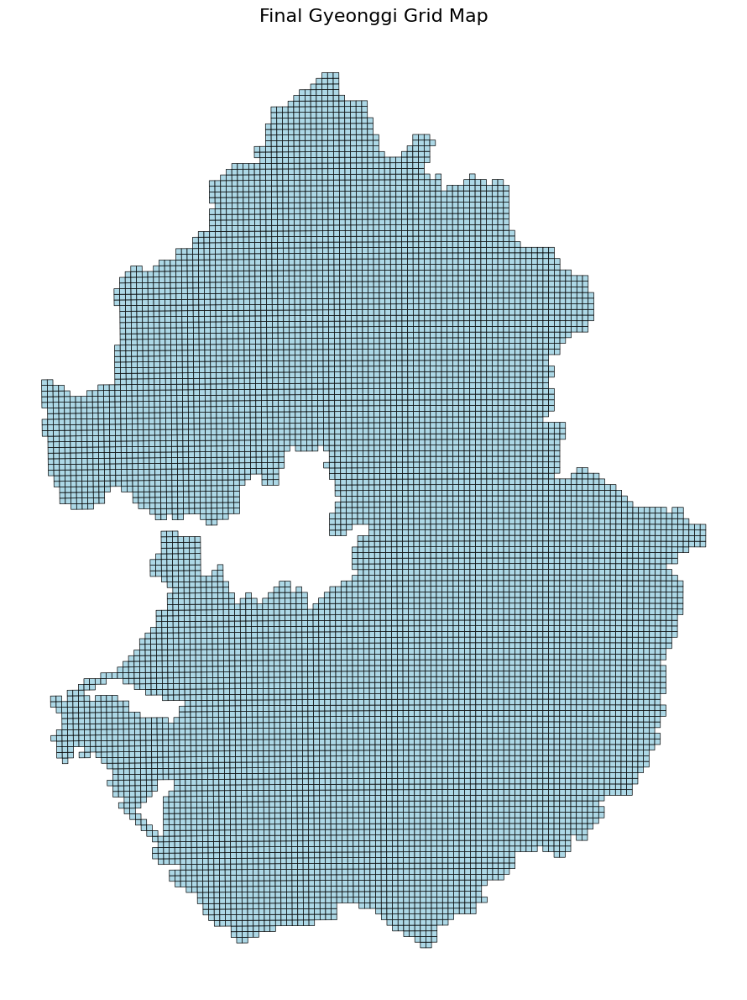

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# Download grid map image.
import matplotlib.pyplot as plt

fig, ax = plt.subplots(1, 1, figsize=(12, 12))

final_data.plot(
    ax=ax,
    color='lightblue',
    edgecolor='black',
    linewidth=0.5
)

ax.set_title('Final Gyeonggi Grid Map', fontsize=16)
ax.axis('off')

plt.tight_layout()
plt.savefig('grid_map.png', dpi=300, bbox_inches='tight')
plt.show()

# Download file.
files.download('grid_map.png')

In [ ]:
# Visualize only the grids where the target variable is 1.
# Create map (centered on Gyeonggi-do).
mmm = folium.Map(location=[37.5, 127.5], zoom_start=9)

filtered_data = final_data[final_data['운행대수'] == 1]

# Draw grid polygons.
folium.GeoJson(
    json.loads(filtered_data.to_json()),
    style_function=lambda feature: {
        'fillColor': 'black',
        'color': 'black',
        'weight': 0.5,
        'fillOpacity': 0.3,
    },
    tooltip=folium.GeoJsonTooltip(
        fields=['GRID_CD', 'senior_population', 'new_village', 'senior_center',
                'medical', 'pharmacy', 'market', 'restaurant',
                'bus_station', 'service_facility', 'enterprise', 'factory', '운행대수'],
        aliases=['격자코드', '고령 인구', '행정복지센터', '경로당', '병원',
                 '약국', '마트', '음식점', '버스정류소',
                 '공중이용시설', '기업', '공장', '운행대수'],
    )
).add_to(mmm)

mmm

# Download file.
mmm.save('drt_service_region_map.html')
files.download('drt_service_region_map.html')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
import folium
import json

# Filter rows where all columns except the first two are 0.
cols_to_check = final_data.columns[2:]
zero_data = final_data[(final_data[cols_to_check] == 0).all(axis=1)]

# Create map (centered on Gyeonggi-do).
zero_map = folium.Map(location=[37.5, 127.5], zoom_start=9)

# Draw grid polygons.
folium.GeoJson(
    json.loads(zero_data.to_json()),
    style_function=lambda feature: {
        'fillColor': 'black',
        'color': 'black',
        'weight': 0.5,
        'fillOpacity': 0.3,
    },
    tooltip=folium.GeoJsonTooltip(
        fields=['GRID_CD', 'senior_population', 'new_village', 'senior_center',
                'medical', 'pharmacy', 'market', 'restaurant',
                'bus_station', 'service_facility', 'enterprise', 'factory', '운행대수'],
        aliases=['격자코드', '고령 인구', '행정복지센터', '경로당', '병원',
                 '약국', '마트', '음식점', '버스정류소',
                 '공중이용시설', '기업', '공장', '운행대수'],
    )
).add_to(zero_map)

# Download file.
zero_map.save('all_columns_zero_map.html')
files.download('all_columns_zero_map.html')

zero_map

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## Use below codes when you do Polygon Visualization

In [ ]:
from shapely import wkt

# Convert string representations of geometry to shapely objects.
final_data['geometry'] = final_data['geometry'].apply(wkt.loads)

# Convert to GeoDataFrame
final_data = gpd.GeoDataFrame(final_data, geometry='geometry', crs='EPSG:4326')